### Library imports

In [40]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

from bs4 import BeautifulSoup
%matplotlib inline

### Data imports

Survey data taken from [Kaggle page](https://www.kaggle.com/datasets/dheemanthbhat/stack-overflow-annual-developer-survey-2022)<br>
Cost of living data taken from [Numbeo page](https://www.numbeo.com/cost-of-living/rankings_by_country.jsp?title=2022-mid)

Three input files:
- Survey results - no explanation needed what's in
- Schema - file with all the questions from the survey
- Cost of living table - Mid 2022 cost of living data

#### Cost of living index

In [41]:
living_cost = pd.read_csv("living_cost.csv")

In [42]:
living_cost.head()

,Rank,Country,Cost of Living Index,Rent Index,Cost of Living Plus Rent Index,Groceries Index,Restaurant Price Index,Local Purchasing Power Index
0,1,Bermuda,141.7,99.0,121.4,142.6,144.7,82.3
1,2,Switzerland,110.3,50.2,81.7,113.3,104.3,116.2
2,3,Bahamas,88.3,38.4,64.5,71.9,94.3,44.2
3,4,Barbados,87.1,21.2,55.7,81.7,74.5,32.6
4,5,Iceland,86.6,35.8,62.4,82.4,88.6,82.6


In [43]:
living_cost.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137 entries, 0 to 136
Data columns (total 8 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Rank                            137 non-null    int64  
 1   Country                         137 non-null    object 
 2   Cost of Living Index            137 non-null    float64
 3   Rent Index                      137 non-null    float64
 4   Cost of Living Plus Rent Index  137 non-null    float64
 5   Groceries Index                 137 non-null    float64
 6   Restaurant Price Index          137 non-null    float64
 7   Local Purchasing Power Index    137 non-null    float64
dtypes: float64(6), int64(1), object(1)
memory usage: 8.7+ KB


In [44]:
living_cost.isna().any()

Rank                              False
Country                           False
Cost of Living Index              False
Rent Index                        False
Cost of Living Plus Rent Index    False
Groceries Index                   False
Restaurant Price Index            False
Local Purchasing Power Index      False
dtype: bool

#### Survey questions

In [45]:
schema = pd.read_csv("survey_results_schema.csv")

In [46]:
schema.head()

,qid,qname,question,force_resp,type,selector
0,QID16,S0,"<div><span style=""font-size:19px;""><strong>Hel...",False,DB,TB
1,QID12,MetaInfo,Browser Meta Info,False,Meta,Browser
2,QID1,S1,"<span style=""font-size:22px; font-family: aria...",False,DB,TB
3,QID2,MainBranch,Which of the following options best describes ...,True,MC,SAVR
4,QID296,Employment,Which of the following best describes your cur...,False,MC,MAVR


In [47]:
schema.isna().any()

qid           False
qname         False
question      False
force_resp    False
type          False
selector      False
dtype: bool

In [48]:
schema.shape

(66, 6)

Thoughts: <br>
- No missing values in questions df.
- Some of them where mandatory to answer some of them not (NAs cleanup will be required in the results survey)
- I will print some of them to see what we have there

In [49]:
def extract_text(question):
    return BeautifulSoup(question).get_text()

schema["question"] = schema.question.apply(extract_text)

In [50]:
for index in range(schema.shape[0]):
    print("+++++++++")
    print(schema["qname"][index])
    print(schema["question"][index])

+++++++++
S0
Hello world! 
 
Thank you for taking the 2022 Stack Overflow Developer Survey, the longest running survey of software developers (and anyone else who codes!) on Earth. 
 
As in previous years, anonymized results of the survey will be made publicly available under the Open Database License, where anyone can download and analyze the data. On that note, throughout the survey, certain answers you and your peers give will be treated as personally identifiable information, and therefore kept out of the anonymized results file. We'll call out each of those in the survey with a note saying "This information will be kept private." 
 
There are seven sections in this survey. The 2nd, 3rd, and 4th sections will appear in a random order.
   1. Basic Information
   2. Education, Work, and Career
   3. Technology and Tech Culture
   4. Stack Overflow Usage + Community
   5. Demographic Information 
   6. Professional Developer Series (Optional)   7. Final Questions

Most questions in th

Thoughts:
- Some of the questions might be not needed in further analysis so let's exclude some columns from results

#### Survey results

In [51]:
df = pd.read_csv("survey_results_public.csv")

In [52]:
df.head(3)

,ResponseId,MainBranch,Employment,RemoteWork,CodingActivities,EdLevel,LearnCode,LearnCodeOnline,LearnCodeCoursesCert,YearsCode,...,TimeSearching,TimeAnswering,Onboarding,ProfessionalTech,TrueFalse_1,TrueFalse_2,TrueFalse_3,SurveyLength,SurveyEase,ConvertedCompYearly
0,1,None of these,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,I am a developer by profession,"Employed, full-time",Fully remote,Hobby;Contribute to open-source projects,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Too long,Difficult,NaN
2,3,"I am not primarily a developer, but I write co...","Employed, full-time","Hybrid (some remote, some in-person)",Hobby,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",Books / Physical media;Friend or family member...,Technical documentation;Blogs;Programming Game...,NaN,14,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Appropriate in length,Neither easy nor difficult,40205.0


### Data processing

After going through questions and some of the answers I decided to drop below columns from df as irrelevant for my further analysis

In [53]:
def gen_list(string, start, end):
    return [f"{string}{i}" for i in range(start, end)]

In [54]:
columns_to_drop = ["ResponseId", "PurchaseInfluence","BuyNewTool", "SurveyLength", "SurveyEase", "TBranch", "Blockchain", "Sexuality", "Trans"] + gen_list("Knowledge_", 1, 8) + gen_list("Frequency_", 1, 4) + gen_list("TrueFalse_", 1, 4) + [col for col in df.columns if col.__contains__("SO")]

In [55]:
df = df.drop(columns_to_drop, axis=1)

In [56]:
df[["CompTotal", "Currency", "CompFreq","ConvertedCompYearly"]]

,CompTotal,Currency,CompFreq,ConvertedCompYearly
0,NaN,NaN,NaN,NaN
1,NaN,CAD\tCanadian dollar,NaN,NaN
2,32000.0,GBP\tPound sterling,Yearly,40205.0
3,60000.0,ILS\tIsraeli new shekel,Monthly,215232.0
4,NaN,USD\tUnited States dollar,NaN,NaN
...,...,...,...,...
73263,60000.0,USD\tUnited States dollar,Yearly,NaN
73264,107000.0,USD\tUnited States dollar,Yearly,NaN
73265,NaN,USD\tUnited States dollar,NaN,NaN
73266,58500.0,GBP\tPound sterling,Yearly,NaN


Thoughts: <br>
- ConvertedCompYearly looks like yearly compensation yearly compansation in USD based on the CompTotal, Currency and CompFreq


Let's check how many people did not input the salary

In [57]:
"Percentage of responders not inputing the compensation "+"{0:.0%}".format(df["ConvertedCompYearly"].isna().mean())

'Percentage of responders not inputing the compensation 48%'

Thoughts:
- 52% or respondes added the information about their compansation
- For further analysis I will drop the rows with empty compensation column as I want to focus on the compansation analysis across different lenses


In [58]:
df_comp = df[~df["ConvertedCompYearly"].isna()]

Let's check other missing data

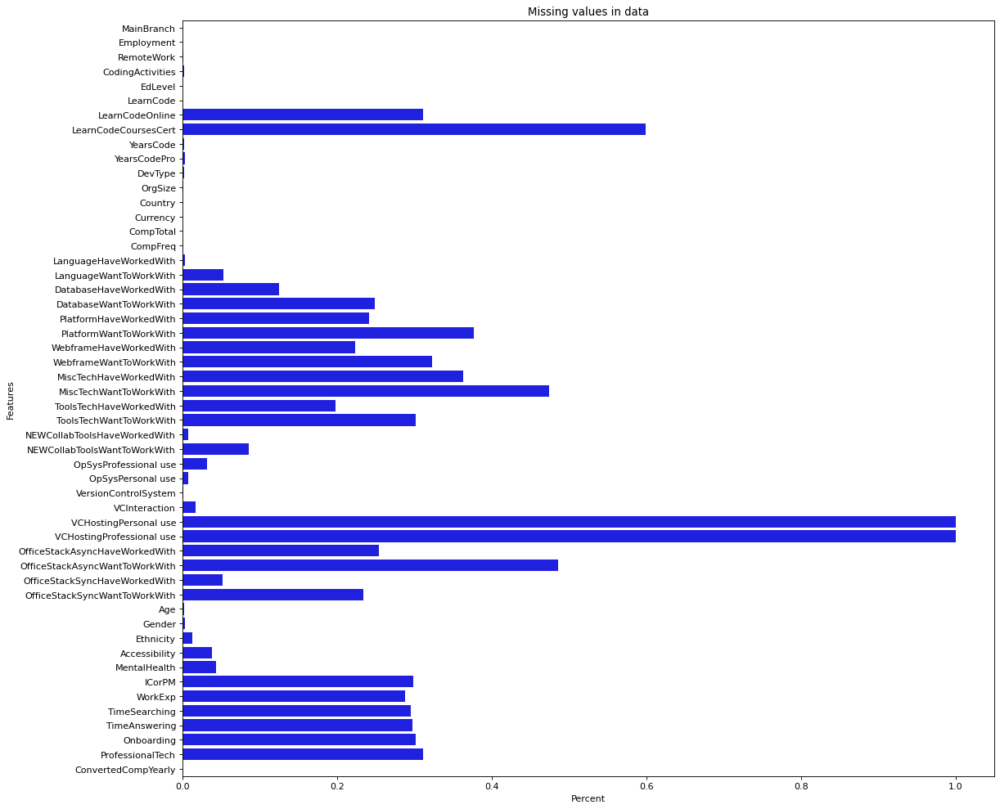

In [59]:
plt.figure(figsize=(16, 15), dpi=80)
sns.barplot(x=df_comp.isna().mean().values, y=df_comp.isna().mean().index, color='blue')
plt.ylabel('Features')
plt.xlabel('Percent')
plt.title('Missing values in data')
plt.show()

After additional consideration I decided to drop all of the columns were missing values are above 10% (it would be difficult to fill missing values in a simple way)

In [60]:
df_comp = df_comp.drop(df_comp.columns[df_comp.isna().mean()>0.1], axis=1)

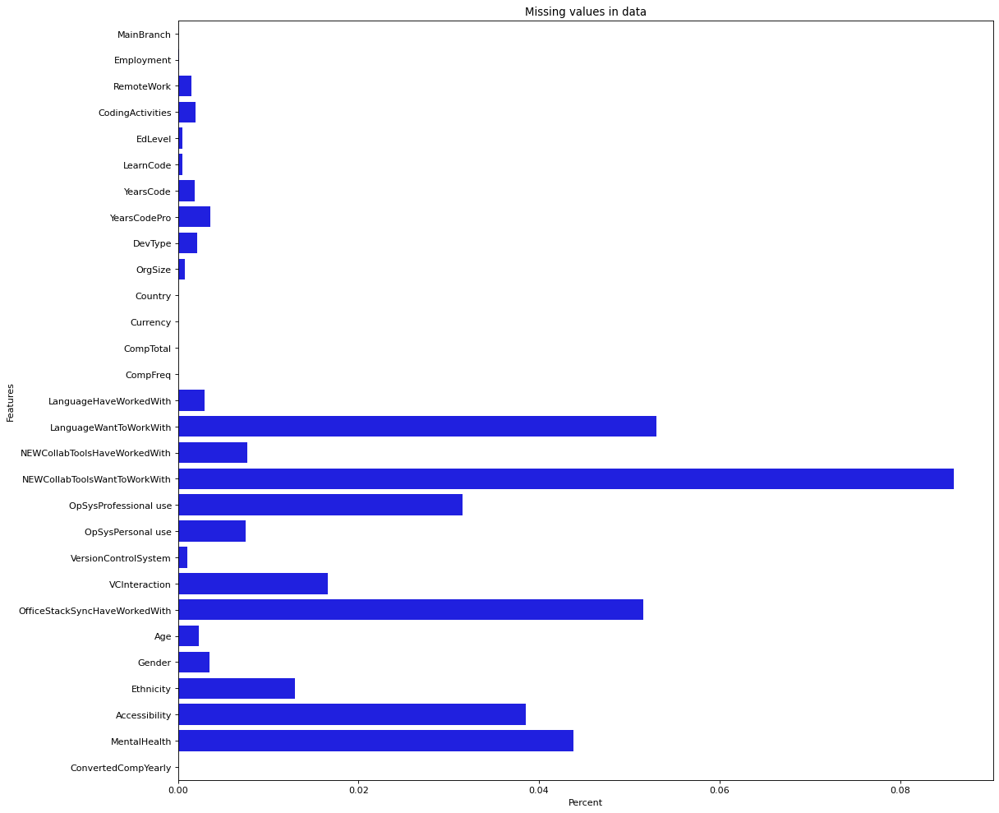

In [61]:
plt.figure(figsize=(16, 15), dpi=80)
sns.barplot(x=df_comp.isna().mean().values, y=df_comp.isna().mean().index, color='blue')
plt.ylabel('Features')
plt.xlabel('Percent')
plt.title('Missing values in data')
plt.show()

Converting two types of strings into years to get the beter picture of YearsCode and YearsCodePro

In [62]:
def convert_year(year):
    if year == "Less than 1 year":
        year = 0
    if year == "More than 50 years":
        year = 51
    if year == "NaN":
        return year
    return float(year)

In [63]:
df_comp["YearsCode"] = df_comp["YearsCode"].apply(convert_year)

In [64]:
df_comp["YearsCodePro"] = df_comp["YearsCodePro"].apply(convert_year)

#### Filling missing values with mode for categorical variables and mean for numerical ones

In [65]:
numeric_vars = ['YearsCode', 'YearsCodePro', "ConvertedCompYearly", 'CompTotal']

In [66]:
cat_vars = [col for col in df_comp.columns if col not in numeric_vars]

In [67]:
fill_mode = lambda col: col.fillna(col.mode()[0])
fill_mean = lambda col: col.fillna(col.mean())

In [68]:
df_comp[numeric_vars] = df_comp[numeric_vars].apply(fill_mean, axis=0)
df_comp[cat_vars] = df_comp[cat_vars].apply(fill_mode, axis=0)

In [69]:
df_comp.isna().any().any()

False

Renaming countries match between survey data and cost of living data

In [70]:
df_comp["Country"].replace({"United Kingdom of Great Britain and Northern Ireland":"United Kingdom", "Hong Kong (S.A.R.)": "Hong Kong", "United States of America":"United States", "Iran, Islamic Republic of...":"Iran", "The former Yugoslav Republic of Macedonia":"North Macedonia", "Syrian Arab Republic":"Syria", "Republic of Moldova":"Moldova", "United Republic of Tanzania":"Tanzania", "Venezuela, Bolivarian Republic of...":"Venezuela", "Libyan Arab Jamahiriya":"Libya"}, inplace=True)
living_cost["Country"].replace({"Bosnia And Herzegovina":"Bosnia and Herzegovina",  "Trinidad And Tobago": "Trinidad and Tobago", "Kosovo (Disputed Territory)":"Kosovo"}, inplace=True)

### Visualisations and questions

#### Question 1: Where do the responders with th highest mean salaries work and hwo does it compare to cost of living in these countries?

In [71]:
df_country = df_comp.groupby("Country")["ConvertedCompYearly"].mean()
df_country = pd.merge(df_country, living_cost, how="inner", on="Country")

In [72]:
fig = px.scatter(df_country, x='Cost of Living Plus Rent Index', y='ConvertedCompYearly', hover_name='Country')
fig.update_layout(title='Mean Salary vs Cost of Living Index', xaxis_title='Cost of Living Index', yaxis_title='Mean Salary')
fig.show()

Looks like there are there are few "dream places" to work from with very high salaries like Thailand or Barbados let's check if these are not single responders

In [73]:
df_comp[df_comp["Country"].isin(["Thailand", "Barbados"])]["Country"].value_counts()

Thailand    83
Barbados     3
Name: Country, dtype: int64

As we can see these are not single developers but still the number of them is quite small <br>
Lets check how this will look like when we exclude potential outliers

In [74]:
fig = px.histogram(df_comp, x="ConvertedCompYearly", marginal = "box")
fig.show()

In [75]:
salary_threshold = df_comp["ConvertedCompYearly"].quantile(0.95)
salary_threshold

383916.0

In [76]:
filtered_data = df_comp[df_comp["ConvertedCompYearly"] <= salary_threshold]

In [77]:
fig = px.histogram(filtered_data, x="ConvertedCompYearly", marginal = "box")
fig.show()

There are still some responders earning more than ~200k but exclusion of the biggest outliers helped to make the data more sensible.

In [78]:
df_country = filtered_data.groupby("Country")["ConvertedCompYearly"].mean()
df_country = pd.merge(df_country, living_cost, how="inner", on="Country")

In [79]:
fig = px.scatter(df_country, x='Cost of Living Plus Rent Index', y='ConvertedCompYearly', hover_name='Country')
fig.update_layout(title='Mean Salary vs Cost of Living Index', xaxis_title='Cost of Living Index', yaxis_title='Mean Salary')
fig.show()

These results look much more reliable. The correlation between cost of living and compansation level is more visible here. <br>


In [80]:
fig = px.scatter(df_country, x='Cost of Living Plus Rent Index', y='ConvertedCompYearly', hover_name='Country')
fig.add_hline(y=df_country['ConvertedCompYearly'].mean(),
                      annotation_text='<b>Mean salary across locations</b>',
                      annotation_position='top right')
fig.add_vline(x=df_country['Cost of Living Plus Rent Index'].mean(),
                      annotation_text='<b>Mean cost of living index</b>',
                      annotation_position='top right')

Adding some mean compansation and mean cost index to the chart allow us to group

#### Question 2: What type of work is the best paied job? Also does the education level impacts the salary or not?

I will use the data excluding some of the outliers that we created with previous question to answer this one

In [84]:
df_jobtype = filtered_data.copy(deep=True)

In [85]:
df_jobtype["FirstDevType"] = df_jobtype["DevType"].str.split(";").str[0].str.split(",").str[0]

In [86]:
px.box(df_jobtype, x = "FirstDevType", y = "ConvertedCompYearly", hover_name = "FirstDevType")

Let's exclude managerial and executive roles from the comparison

In [87]:
df_nonmanager = df_jobtype[~(df_jobtype["FirstDevType"].str.contains("manager|Executive"))]

In [88]:
px.box(df_nonmanager, x = "FirstDevType", y = "ConvertedCompYearly", hover_name = "FirstDevType")

Looks like the highest salaries are paid to Data Scientists, Developers, System Administrators or Cloud engineers. However these are mostly limited cases. <br>
Looking at the consistency of pay across the group the Marketing or sales professional role is also a good choice. <br>
Also quite intresting observation is the range of compansation for the Blockchain specialist.

In [89]:
df_jobtype["Education"] = None
df_jobtype["Education"] = np.where(df_jobtype["EdLevel"].isin(["Primary/elementary school", "Something else"]), "Primary or other", df_jobtype["Education"])
df_jobtype["Education"] = np.where(df_jobtype["EdLevel"].isin([r"Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)", "Some college/university study without earning a degree"]), "Secondary", df_jobtype["Education"])    
df_jobtype["Education"] = np.where(df_jobtype["EdLevel"].isin(["Bachelor’s degree (B.A., B.S., B.Eng., etc.)", "Associate degree (A.A., A.S., etc.)"]), "Undergraduate", df_jobtype["Education"])                     
df_jobtype["Education"] = np.where(df_jobtype["EdLevel"].isin([r"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)", r"Other doctoral degree (Ph.D., Ed.D., etc.)", r"Professional degree (JD, MD, etc.)"]), "Advanced graduate", df_jobtype["Education"])

In [90]:
px.box(df_jobtype, x = "Education", y = "ConvertedCompYearly", hover_name = "Education")

Looking at the education level it is visible that responders with primary or other education are paind below the other responders. <br>
From the other education levels seems like that undergraduates do have slightly better salaries then advanced graduates. <br>
However looking at the pie chart below this group also dominates in terms of overal number of responders.

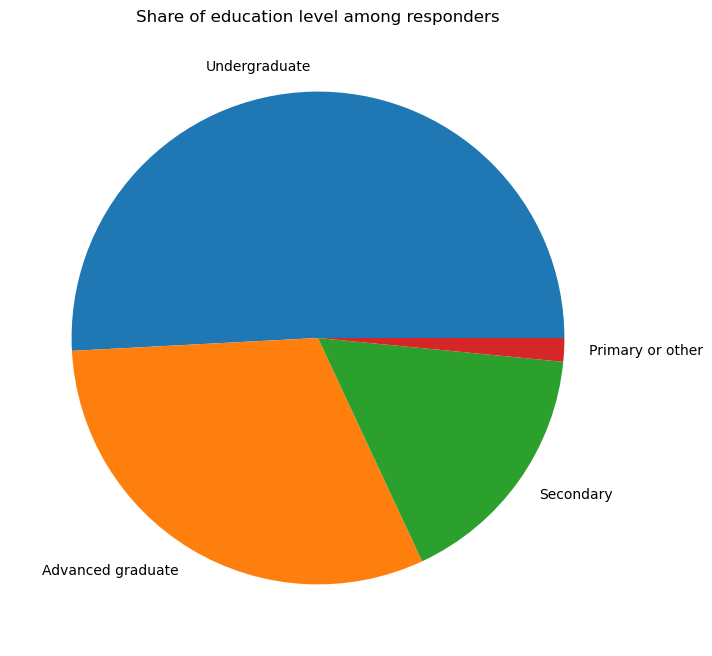

In [96]:
education = df_jobtype["Education"].str.split(";").explode().value_counts()
plt.figure(figsize=(8,8))
plt.pie(education, labels=education.index)
plt.title('Share of education level among responders')
plt.show()

#### Question 3: What tools and languages are mostly used by the reposnders?

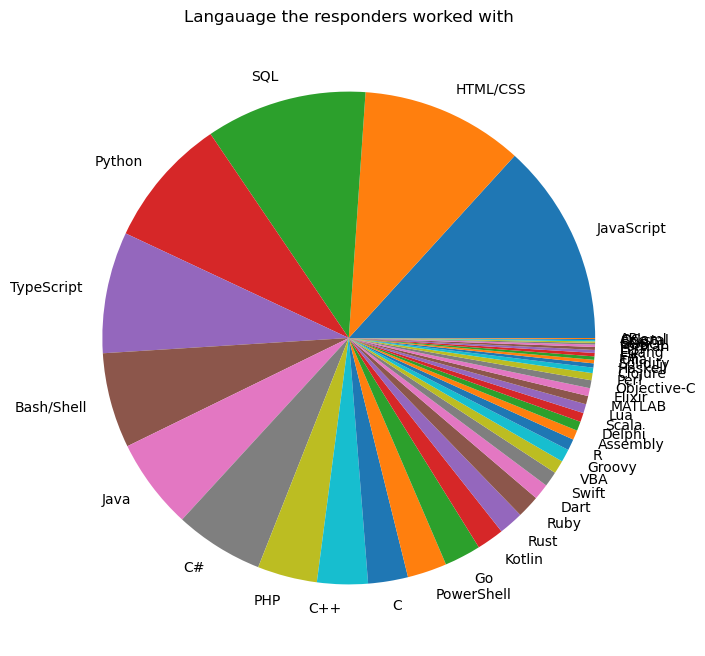

In [97]:
work_languages = df_comp["LanguageHaveWorkedWith"].str.split(";").explode().value_counts()
plt.figure(figsize=(8,8))
plt.pie(work_languages, labels=work_languages.index)
plt.title('Langauage the responders worked with')
plt.show()

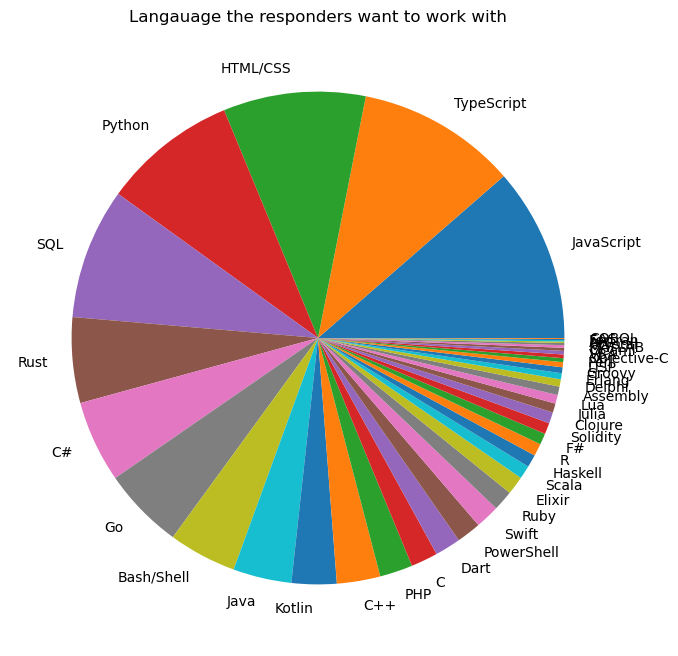

In [98]:
towork_languages = df_comp["LanguageWantToWorkWith"].str.split(";").explode().value_counts()
plt.figure(figsize=(8,8))
plt.pie(towork_languages, labels=towork_languages.index)
plt.title('Langauage the responders want to work with')
plt.show()

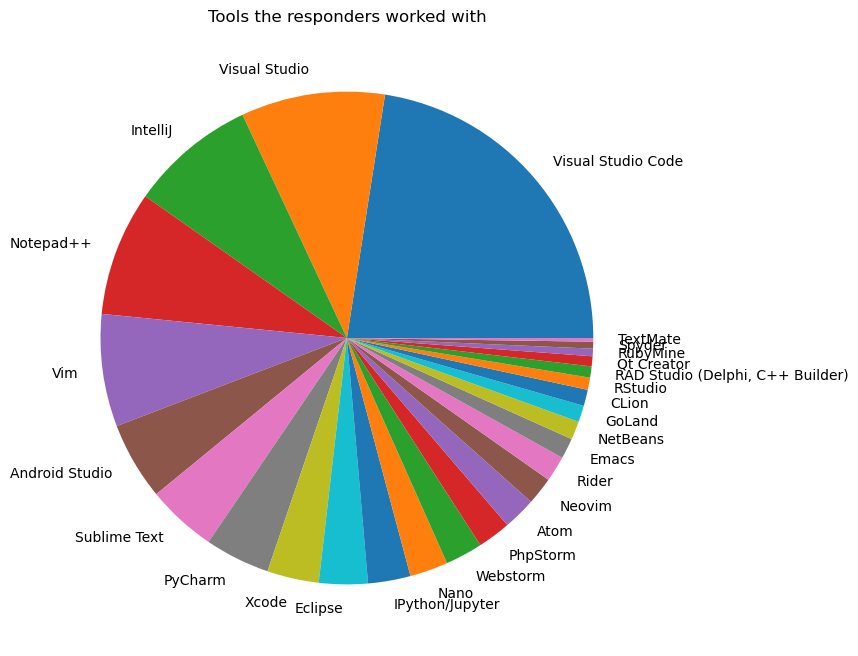

In [100]:
worked_tools = df_comp["NEWCollabToolsHaveWorkedWith"].str.split(";").explode().value_counts()
plt.figure(figsize=(8,8))
plt.pie(worked_tools, labels=worked_tools.index)
plt.title('Tools the responders worked with')
plt.show()

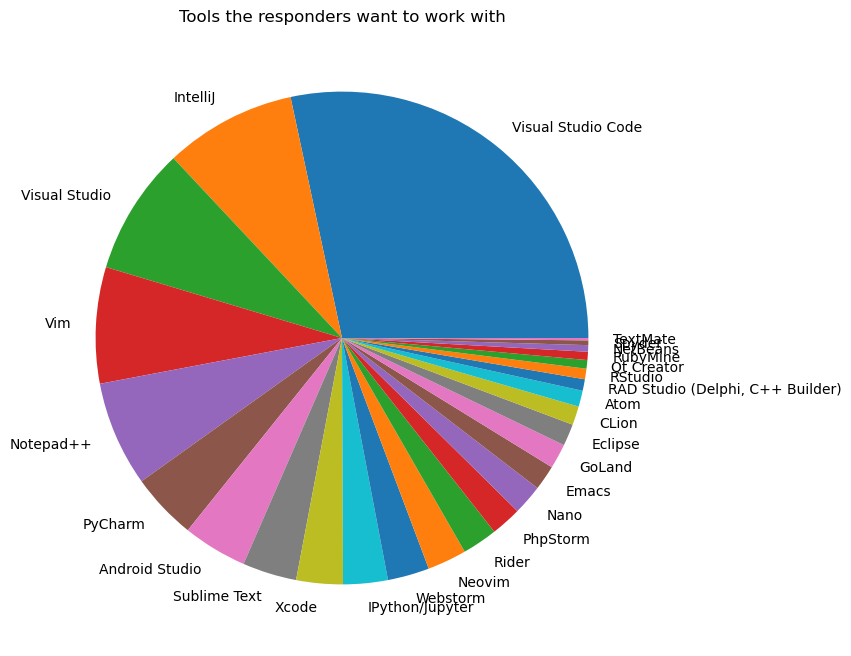

In [99]:
towork_tools = df_comp["NEWCollabToolsWantToWorkWith"].str.split(";").explode().value_counts()
plt.figure(figsize=(8,8))
plt.pie(towork_tools, labels=towork_tools.index)
plt.title('Tools the responders want to work with')
plt.show()

Looking at the charts with tools used to code there is a domination of the tools from Microsoft in terms of IDE tools and code editiors visible. <br>
Though the are also tools like Indellij and PyCharm created by JetBrains that hold the second place. <br>

Other commonly used tools are Vim, Notepad++ and Sublime Text so text editors.